# DCGAN Architecture Implementation
This code showcases a full implementation of the DCGAN architecture for two datasets, one being of Pokemon Sprites and another of Human-like sprites.

This file is meant to be run in order so do not skip around the cells.

The code was run on the standard t4 GPU available in Google Colab.


You can find this code and the other code we have written in relation to this project here: https://github.com/MohitAgrawal404/DCGAN_Sprite_Generation/tree/main

We used PyTorch's own example of DCGAN to aid us in our implementation:  https://github.com/pytorch/examples/blob/main/dcgan/main.py

This is just to mount your google drive. Choose the folder you want after but this will default to your root.

In [40]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


This is just the setup. Here we set up our imports.

In [41]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

This loads the dataset from our github. Make sure to change 'which_dataset' to either pokemon or human based on which dataset you want to run.

If you have already downloaded the dataset into the root of your project then you can skip this OR if you aren't sure then just type 'A' when it prompts you to replace something which will replace the whole folder (you will need to double click where it prompts you).

---



In [42]:
# Choose between "pokemon" and "human"
which_dataset = "pokemon"

folder_name = f"{which_dataset}_sprites"
zip_file = f"{folder_name}.zip"
url = f"https://raw.githubusercontent.com/MohitAgrawal404/DCGAN_Sprite_Generation/main/{zip_file}"

# Download
!wget "{url}"

!mkdir -p "{folder_name}"
# Unzip
!unzip -q "{zip_file}" -d "{folder_name}"

# Delete zip
!rm "{zip_file}"

--2025-12-06 04:13:59--  https://raw.githubusercontent.com/MohitAgrawal404/DCGAN_Sprite_Generation/main/pokemon_sprites.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8465377 (8.1M) [application/zip]
Saving to: ‘pokemon_sprites.zip’

pokemon_sprites.zip 100%[===================>]   8.07M  --.-KB/s    in 0.02s   

2025-12-06 04:14:00 (429 MB/s) - ‘pokemon_sprites.zip’ saved [8465377/8465377]

replace pokemon_sprites/pokemon_like/224-gen4_dp-frame2.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


These are the main parameters where we set things like our batch size and feature sizes.

In [43]:
# Directory for dataset change this if you want to use the other dataset --------------------------
dataroot = folder_name


# Shared params between all networks --------------------------
## All images will be resized to this size
image_size = 64

## Number of channels in the training images. For color images this is 3 (rgb)
num_channels = 3


# Generator specific params --------------------------
## Size of generator input, this is your noise's size where you will do your upscaling from
noise_input_size = 100

## Size of feature maps in generator
gen_feature_map_size = 64


# Discriminator specific params --------------------------
## Size of feature maps in discriminator
dis_feature_map_size = 64


# Training params --------------------------
## Batch size during training (Reduce this if you have heavy contraints but we recommend keeping it as this)
if dataroot == "pokemon_sprites":
  batch_size = 128
else:
  batch_size = 64

## Number of training epochs. Don't increase this too much or Discriminator can overpower Generator
num_epochs = 200

## Learning rate for all models, this is shared because we didn't find the dicriminator overpower but if you want to train for longer think about halving the lr of the discriminator separately
lr = 0.0002

## Beta1 for Adam optimizer helps with stability (momentum)
beta1 = 0.5

Now we need to load the data into 64x64 format

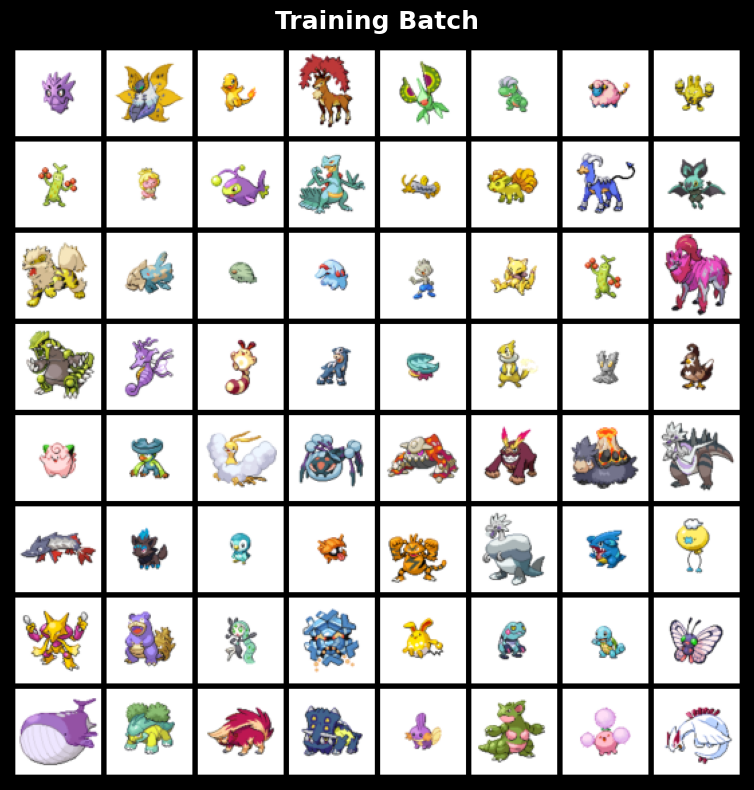

In [44]:
# Create the dataset and format it to fit the 64x64 size.
dataset = dset.ImageFolder(root=dataroot, transform=transforms.Compose([transforms.Resize(image_size),
                                                                        transforms.CenterCrop(image_size),
                                                                        transforms.ToTensor(),
                                                                        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),]))
# Create the dataloader to load the data
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)

device = torch.device("cuda:0")

# Training images
batch = next(iter(dataloader))
images = batch[0].to(device)

# Visual to see subset of the data
grid = (vutils.make_grid(images[:64], padding=4, normalize=True).cpu().permute(1, 2, 0))

plt.style.use("dark_background")
plt.figure(figsize=(8, 8))

plt.imshow(grid)
plt.title("Training Batch", fontsize=18, pad=12, fontweight="bold")
plt.axis("off")

plt.gca().spines["top"].set_visible(True)
plt.gca().spines["right"].set_visible(True)
plt.gca().spines["bottom"].set_visible(True)
plt.gca().spines["left"].set_visible(True)

plt.tight_layout()
plt.show()


In [45]:
# This is just setting out default weights for the model to start off with.
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

Generator. This takes in some noise and upscales it into a rgb sprite image.

In [46]:
# Generator Class
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        layers = []

        # Input is Z going into a transposed convolution
        layers.append(nn.ConvTranspose2d(noise_input_size, gen_feature_map_size * 8, kernel_size=4, stride=1, padding=0, bias=False))
        layers.append(nn.BatchNorm2d(gen_feature_map_size * 8))
        layers.append(nn.ReLU(inplace=True))

        # State size: (gen_feature_map_size*8) x 4 x 4
        layers.append(nn.ConvTranspose2d(gen_feature_map_size * 8, gen_feature_map_size * 4, kernel_size=4, stride=2, padding=1, bias=False))
        layers.append(nn.BatchNorm2d(gen_feature_map_size * 4))
        layers.append(nn.ReLU(inplace=True))

        # State size: (gen_feature_map_size*4) x 8 x 8
        layers.append(nn.ConvTranspose2d(gen_feature_map_size * 4, gen_feature_map_size * 2, kernel_size=4, stride=2, padding=1, bias=False))
        layers.append(nn.BatchNorm2d(gen_feature_map_size * 2))
        layers.append(nn.ReLU(inplace=True))

        # State size: (gen_feature_map_size*2) x 16 x 16
        layers.append(nn.ConvTranspose2d(gen_feature_map_size * 2, gen_feature_map_size, kernel_size=4, stride=2, padding=1, bias=False))
        layers.append(nn.BatchNorm2d(gen_feature_map_size))
        layers.append(nn.ReLU(inplace=True))

        # Final layer: (gen_feature_map_size) x 32 x 32  to  (num_channels) x 64 x 64
        layers.append(nn.ConvTranspose2d(gen_feature_map_size, num_channels, kernel_size=4, stride=2, padding=1, bias=False))
        layers.append(nn.Tanh())

        self.main = nn.Sequential(*layers)

    def forward(self, input):
        output = self.main(input)
        return output

# Create instance of generator
generator_network = Generator().to(device)

# Apply the weights_init function to randomly initialize all weights
generator_network.apply(weights_init)

# Print the model
print(generator_network)


Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


Dicriminator

In [47]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        layers = []

        # Input: (num_channels) x 64 x 64
        layers.append(nn.Conv2d(num_channels, dis_feature_map_size,
                                kernel_size=4, stride=2, padding=1, bias=False))
        layers.append(nn.LeakyReLU(0.2, inplace=True))

        # (dis_feature_map_size) x 32 x 32
        layers.append(nn.Conv2d(dis_feature_map_size, dis_feature_map_size * 2,
                                kernel_size=4, stride=2, padding=1, bias=False))
        layers.append(nn.BatchNorm2d(dis_feature_map_size * 2))
        layers.append(nn.LeakyReLU(0.2, inplace=True))

        # (dis_feature_map_size*2) x 16 x 16
        layers.append(nn.Conv2d(dis_feature_map_size * 2, dis_feature_map_size * 4,
                                kernel_size=4, stride=2, padding=1, bias=False))
        layers.append(nn.BatchNorm2d(dis_feature_map_size * 4))
        layers.append(nn.LeakyReLU(0.2, inplace=True))

        # (dis_feature_map_size*4) x 8 x 8
        layers.append(nn.Conv2d(dis_feature_map_size * 4, dis_feature_map_size * 8,
                                kernel_size=4, stride=2, padding=1, bias=False))
        layers.append(nn.BatchNorm2d(dis_feature_map_size * 8))
        layers.append(nn.LeakyReLU(0.2, inplace=True))

        # Output: (dis_feature_map_size*8) x 4 x 4 to 1 x 1 x 1
        layers.append(nn.Conv2d(dis_feature_map_size * 8, 1,
                                kernel_size=4, stride=1, padding=0, bias=False))
        layers.append(nn.Sigmoid())

        self.main = nn.Sequential(*layers)

    def forward(self, input):
        return self.main(input)


# Create the Discriminator instance
discriminator_network = Discriminator().to(device)


# Apply the weights_init function to randomly initialize all weights
discriminator_network.apply(weights_init)

# Print the model
print(discriminator_network)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


Loss + Optimizers

In [48]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, noise_input_size, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(discriminator_network.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(generator_network.parameters(), lr=lr, betas=(beta1, 0.999))

Train

In [49]:
img_list = []      # store snapshots of generated images
G_losses = []      # generator loss history
D_losses = []      # discriminator loss history
iters = 0

print("Starting Training Loop...")

for epoch in range(num_epochs):
    for batch_idx, batch in enumerate(dataloader):

        # -----------------------------
        # Step 1: Train Discriminator
        # -----------------------------
        discriminator_network.zero_grad()

        real_images = batch[0].to(device)
        batch_size = real_images.size(0)

        real_targets = torch.full(
            (batch_size,),
            real_label,
            dtype=torch.float,
            device=device
        )

        # Real pass
        disc_out_real = discriminator_network(real_images).view(-1)
        loss_D_real = criterion(disc_out_real, real_targets)
        loss_D_real.backward()
        D_x = disc_out_real.mean().item()

        # Fake inputs
        noise_vectors = torch.randn(
            batch_size,
            noise_input_size,
            1,
            1,
            device=device
        )
        fake_images = generator_network(noise_vectors)

        fake_targets = torch.full(
            (batch_size,),
            fake_label,
            dtype=torch.float,
            device=device
        )

        # Fake pass (detach so G is not updated here)
        disc_out_fake = discriminator_network(fake_images.detach()).view(-1)
        loss_D_fake = criterion(disc_out_fake, fake_targets)
        loss_D_fake.backward()
        D_G_z1 = disc_out_fake.mean().item()

        # Total discriminator loss + update
        loss_D_total = loss_D_real + loss_D_fake
        optimizerD.step()

        # -----------------------------
        # Step 2: Train Generator
        # -----------------------------
        generator_network.zero_grad()

        # For generator, pretend fake images are real
        gen_targets = torch.full(
            (batch_size,),
            real_label,
            dtype=torch.float,
            device=device
        )

        disc_out_for_G = discriminator_network(fake_images).view(-1)
        loss_G = criterion(disc_out_for_G, gen_targets)
        loss_G.backward()
        D_G_z2 = disc_out_for_G.mean().item()
        optimizerG.step()

        # Progress output
        if batch_idx % 50 == 0:
            print(
                '[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\t'
                'D(x): %.4f\tD(G(z)): %.4f / %.4f'
                % (
                    epoch,
                    num_epochs,
                    batch_idx,
                    len(dataloader),
                    loss_D_total.item(),
                    loss_G.item(),
                    D_x,
                    D_G_z1,
                    D_G_z2,
                )
            )

        # Track losses
        G_losses.append(loss_G.item())
        D_losses.append(loss_D_total.item())

        # Periodic generator output preview
        if (iters % 500 == 0) or (
            (epoch == num_epochs - 1) and (batch_idx == len(dataloader) - 1)
        ):
            with torch.no_grad():
                preview_fake = generator_network(fixed_noise).detach().cpu()
            img_list.append(
                vutils.make_grid(preview_fake, padding=2, normalize=True)
            )

        iters += 1


Starting Training Loop...
[0/200][0/32]	Loss_D: 1.9245	Loss_G: 4.7911	D(x): 0.4975	D(G(z)): 0.6123 / 0.0133
[1/200][0/32]	Loss_D: 1.9145	Loss_G: 24.8220	D(x): 0.9881	D(G(z)): 0.7584 / 0.0000
[2/200][0/32]	Loss_D: 0.9085	Loss_G: 10.9493	D(x): 0.9704	D(G(z)): 0.4979 / 0.0000
[3/200][0/32]	Loss_D: 0.3478	Loss_G: 4.8241	D(x): 0.9276	D(G(z)): 0.1963 / 0.0128
[4/200][0/32]	Loss_D: 0.2601	Loss_G: 5.1680	D(x): 0.8593	D(G(z)): 0.0446 / 0.0077
[5/200][0/32]	Loss_D: 0.2013	Loss_G: 4.5039	D(x): 0.8943	D(G(z)): 0.0658 / 0.0169
[6/200][0/32]	Loss_D: 0.1800	Loss_G: 3.9533	D(x): 0.9446	D(G(z)): 0.1004 / 0.0255
[7/200][0/32]	Loss_D: 0.2598	Loss_G: 6.3695	D(x): 0.9508	D(G(z)): 0.1795 / 0.0024
[8/200][0/32]	Loss_D: 0.5863	Loss_G: 8.4245	D(x): 0.8569	D(G(z)): 0.2959 / 0.0004
[9/200][0/32]	Loss_D: 0.1899	Loss_G: 4.3137	D(x): 0.9181	D(G(z)): 0.0721 / 0.0222
[10/200][0/32]	Loss_D: 0.9978	Loss_G: 12.3655	D(x): 0.9838	D(G(z)): 0.5997 / 0.0000
[11/200][0/32]	Loss_D: 0.3565	Loss_G: 4.9470	D(x): 0.8705	D(G(z)): 0

Visualize

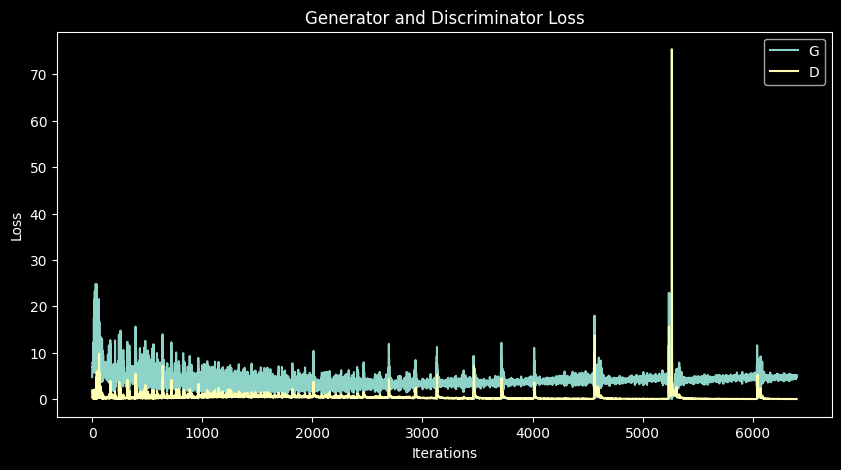

In [54]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Progression

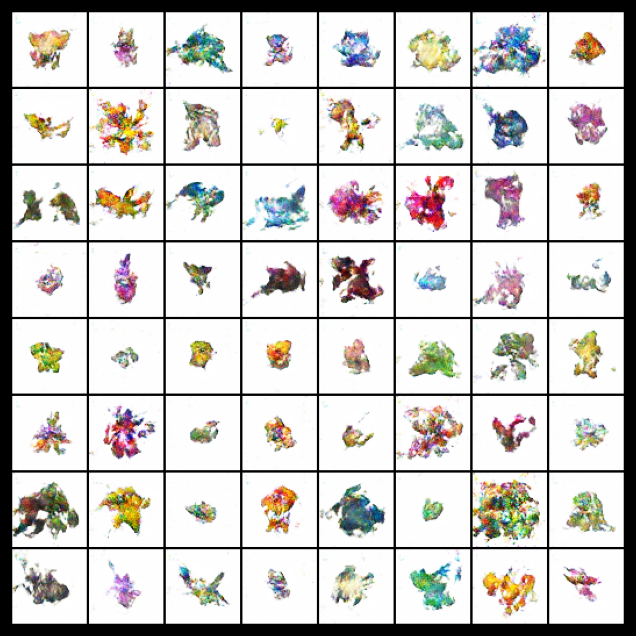

In [51]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

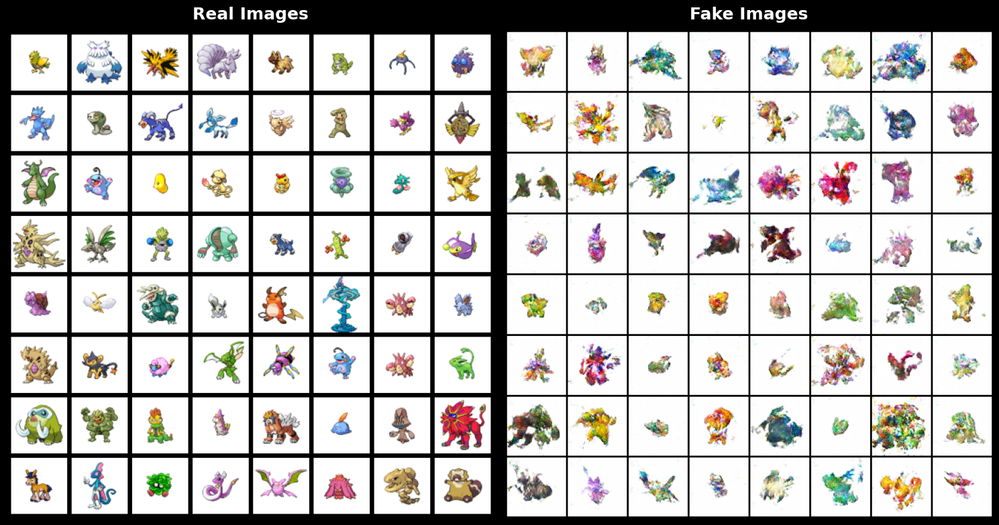

In [52]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.style.use("dark_background")

fig, axes = plt.subplots(1, 2, figsize=(15, 15))

# --- Real Images ---
real_grid = vutils.make_grid(
    real_batch[0].to(device)[:64],
    padding=5,
    normalize=True
).cpu().permute(1, 2, 0)

axes[0].imshow(real_grid)
axes[0].set_title("Real Images", fontsize=18, fontweight="bold", pad=12)
axes[0].axis("off")

# --- Fake Images ---
fake_grid = np.transpose(img_list[-1], (1, 2, 0))

axes[1].imshow(fake_grid)
axes[1].set_title("Fake Images", fontsize=18, fontweight="bold", pad=12)
axes[1].axis("off")

for ax in axes:
    for spine in ax.spines.values():
        spine.set_visible(True)

plt.tight_layout()
plt.show()
